Connecting Google Drive and
Data Visulaization


Mounted at /content/drive
Sheet names in Source 1 file: ['record_data_2020-10-29_10-41-1_']
Sheet names in Source 2 file: ['record_data_2020-10-29_10-30-40']
   0.000383969  0.000639947999999999  0.00140788  0.00179184999999999  \
0    -0.003712             -0.003968   -0.004608            -0.004992   
1    -0.000640             -0.000512   -0.000768            -0.000640   
2    -0.001152             -0.000896   -0.000384             0.000128   
3    -0.002176             -0.001920   -0.001024            -0.000640   
4     0.016895              0.011903    0.006016            -0.000128   

   0.00140788.1  0.0012799  0.00191983999999999  0.00230380999999999  \
0     -0.005632  -0.006016            -0.006271            -0.006016   
1     -0.000768   0.000000            -0.000256            -0.000256   
2      0.000000  -0.000128            -0.000768            -0.001280   
3     -0.000512  -0.000640            -0.000896            -0.000896   
4     -0.006016  -0.012671            -0.01

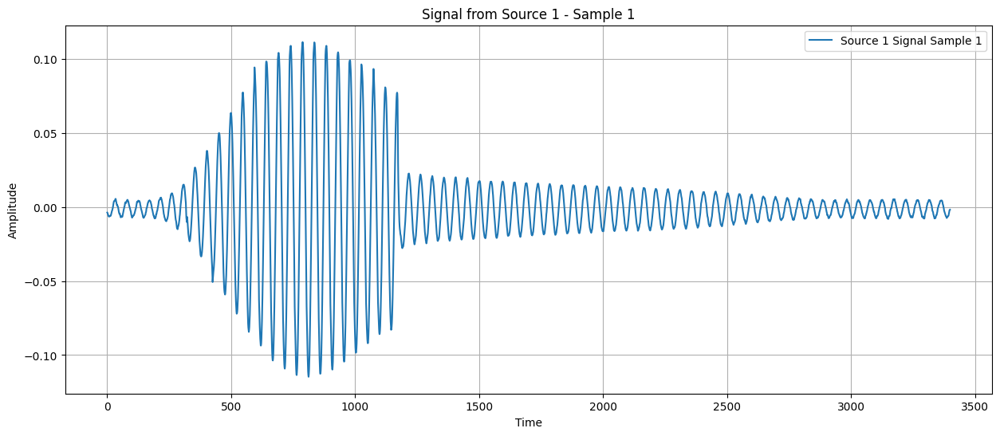

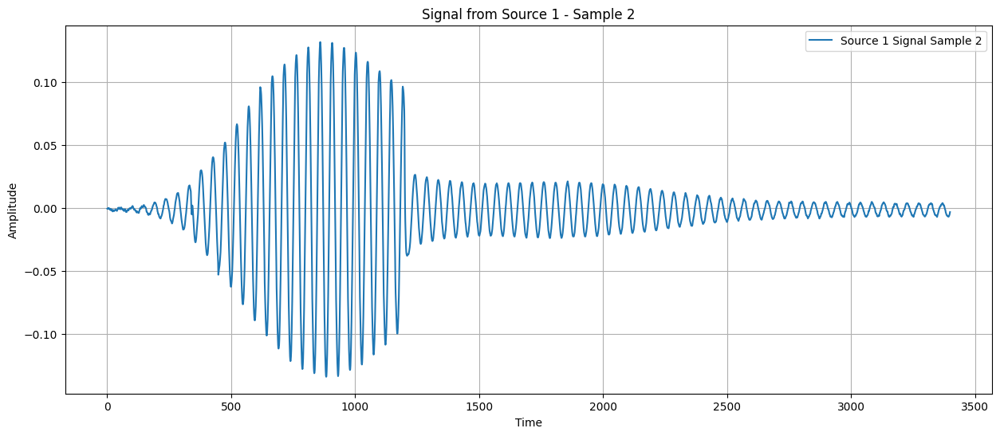

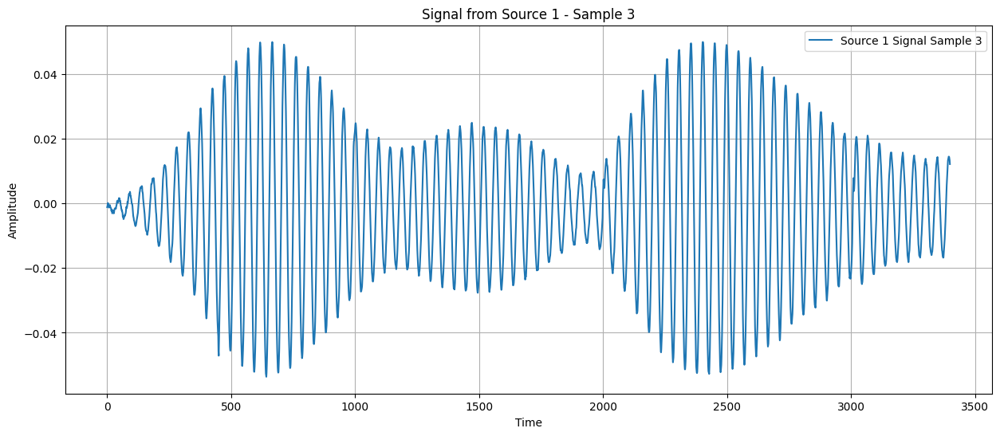

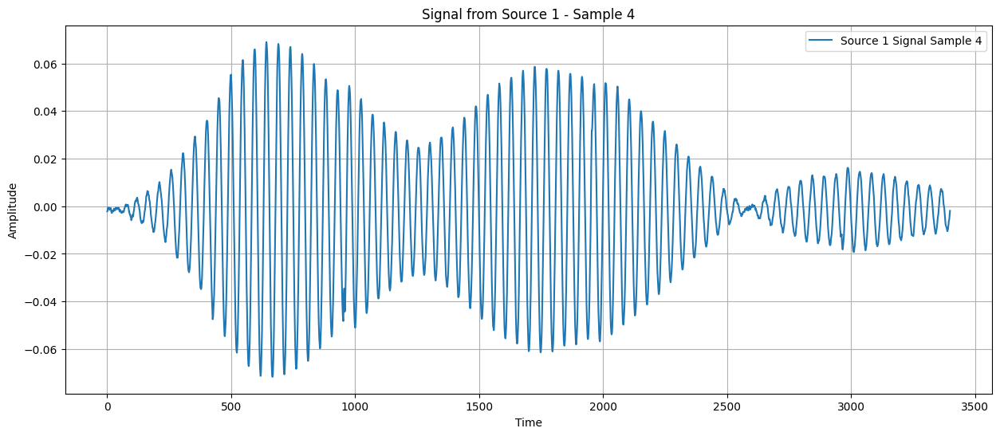

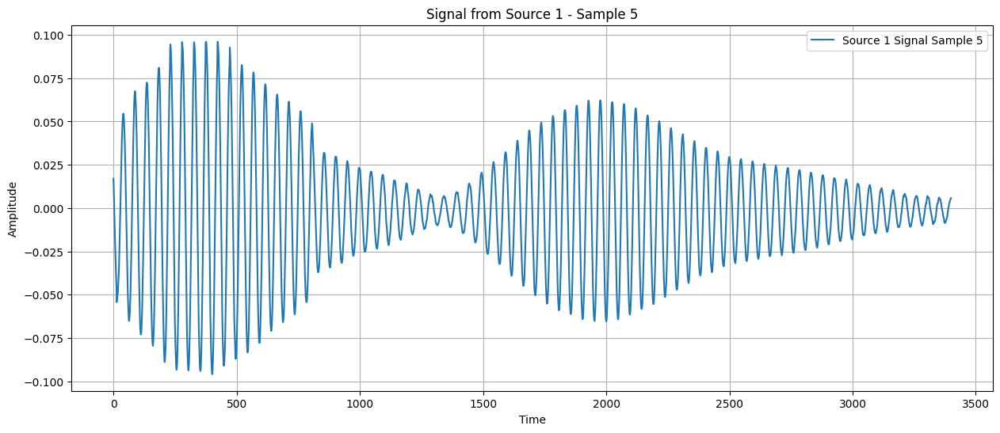

...

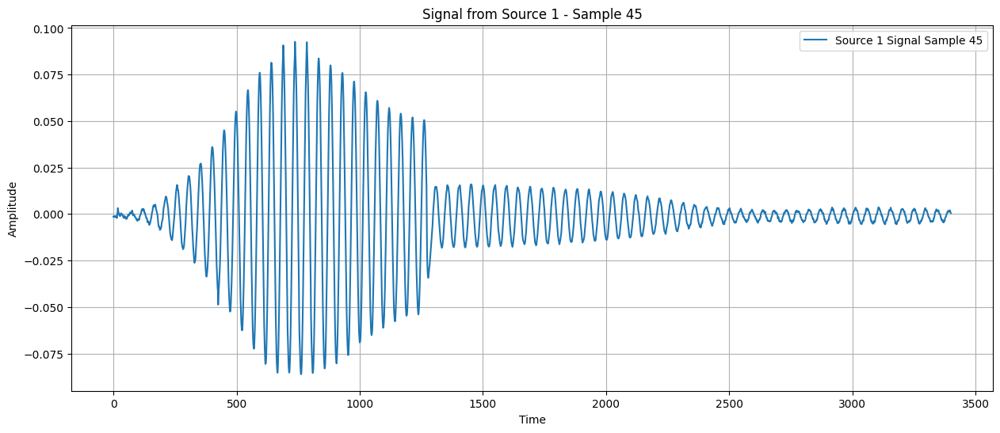

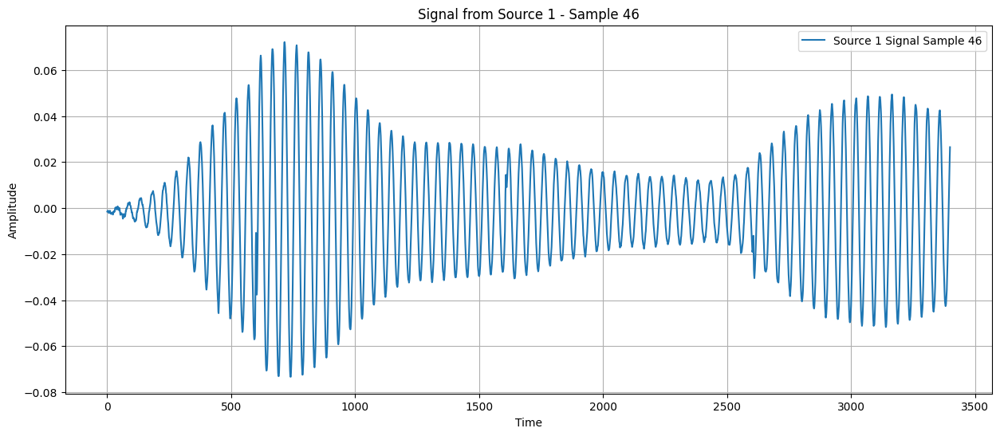

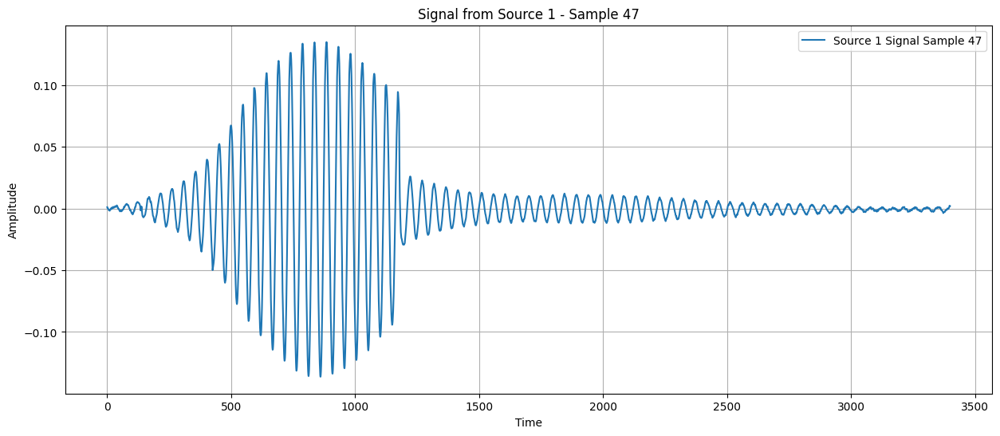

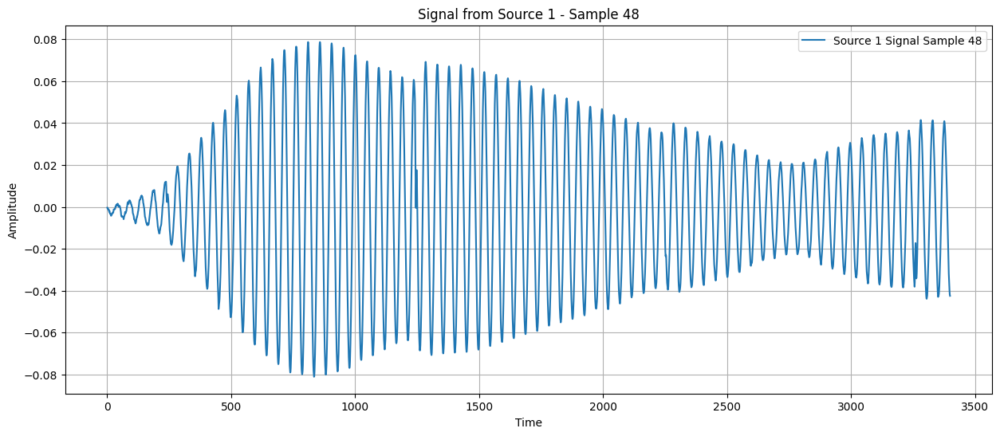

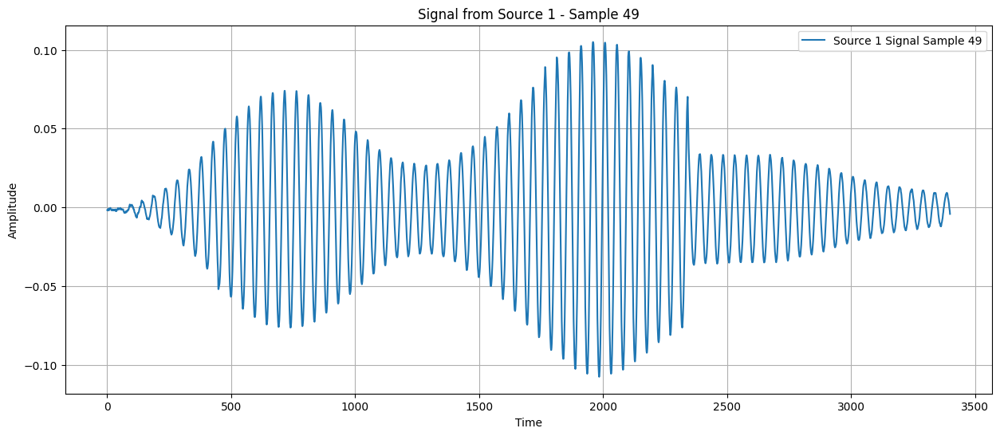

Plotting all signals from Source 2...


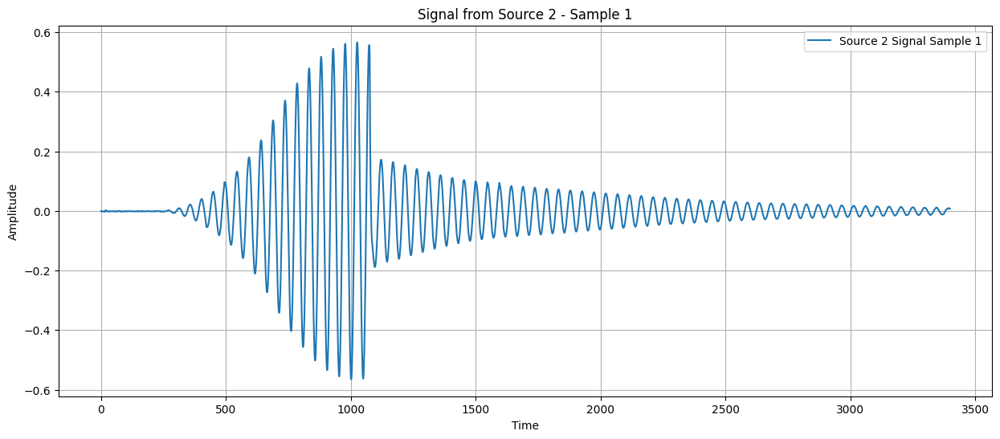

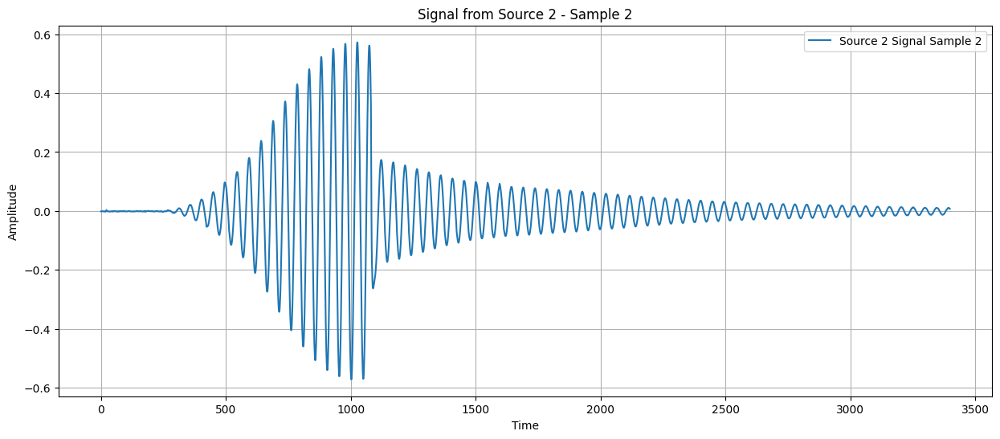

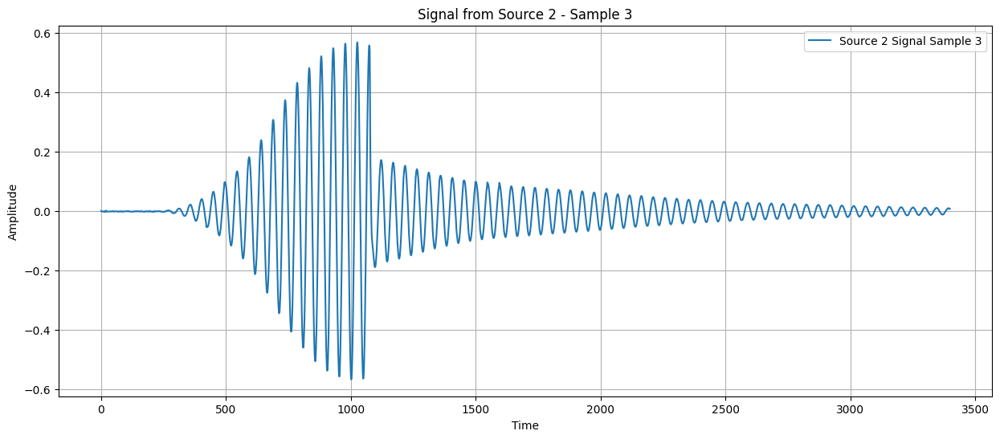

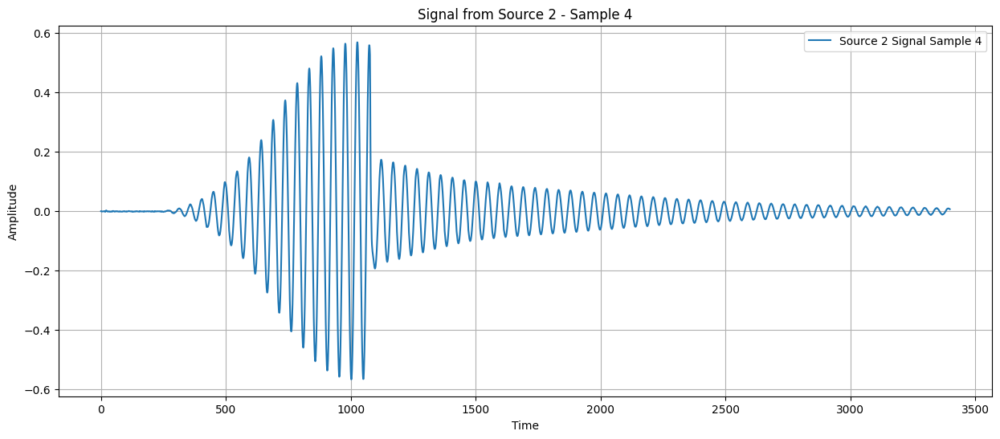

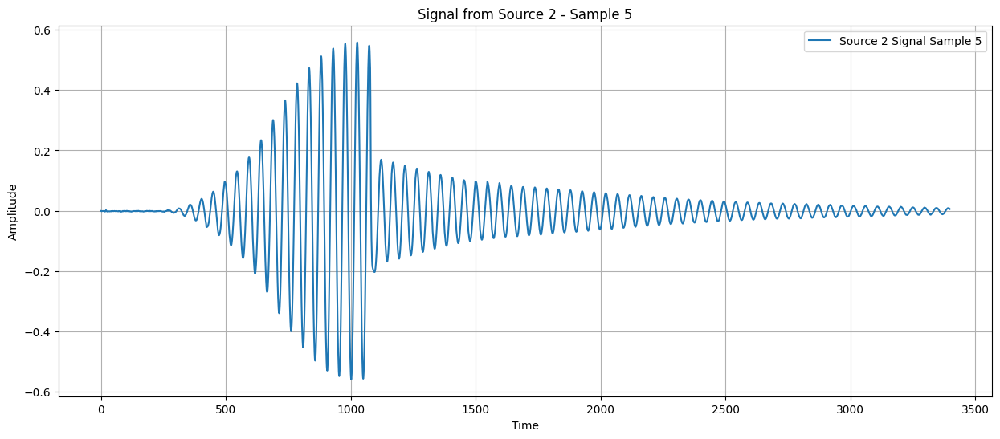

...

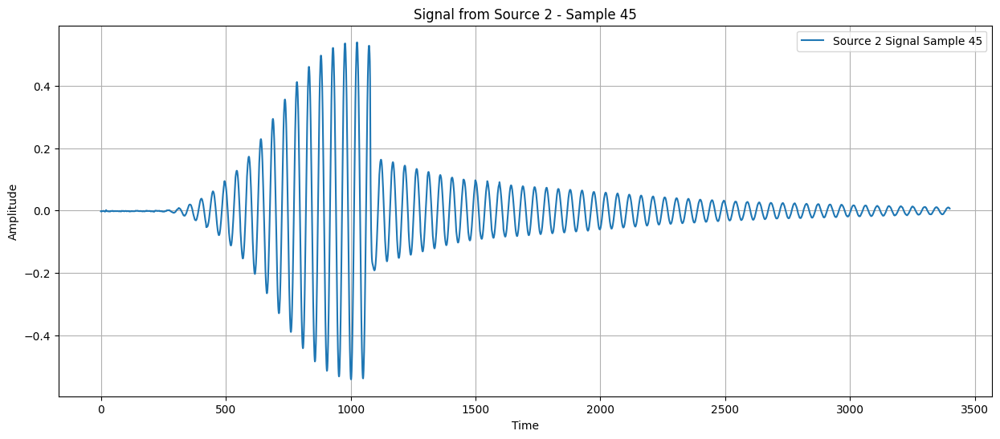

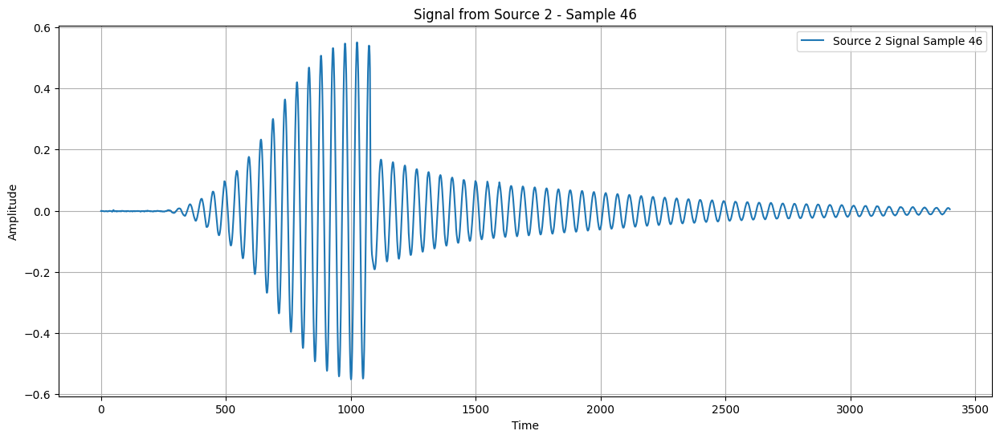

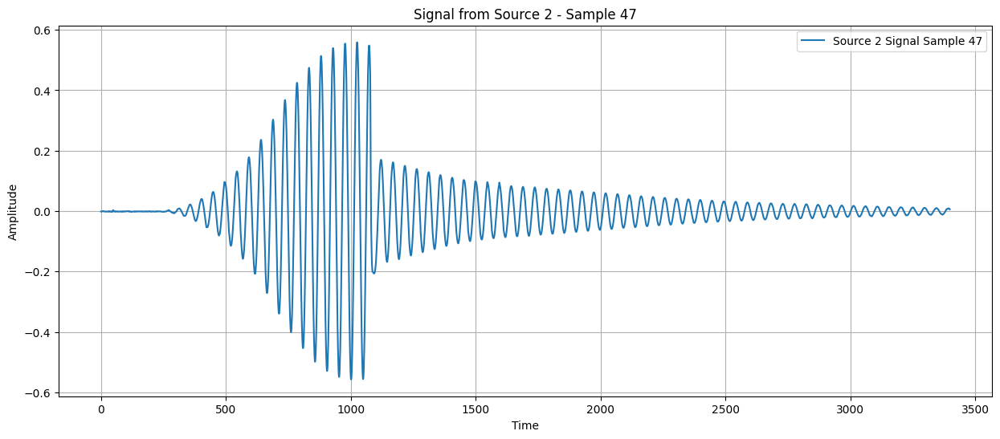

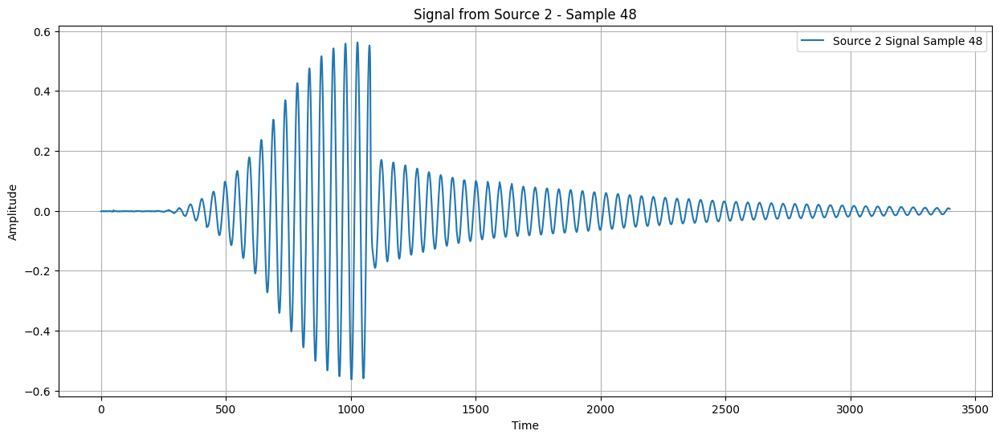

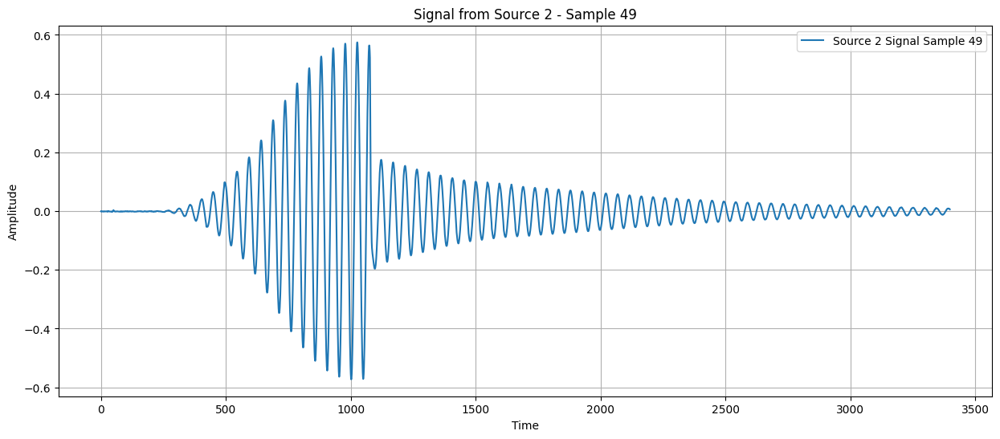

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential, save_model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
import seaborn as sns

# Google Colab setup
from google.colab import drive
drive.mount('/content/drive')

# Define the paths to your Excel files
file_path_source1 = '/content/drive/MyDrive/CI PROJECT/Datasets/Dataset/Object-1/Object-1.xlsx'  # Adjust the path as needed
file_path_source2 = '/content/drive/MyDrive/CI PROJECT/Datasets/Dataset/Object-2/Object-2.xlsx'  # Adjust the path as needed

# Check available sheet names in the files
xls1 = pd.ExcelFile(file_path_source1)
xls2 = pd.ExcelFile(file_path_source2)

# Display the sheet names
print("Sheet names in Source 1 file:", xls1.sheet_names)
print("Sheet names in Source 2 file:", xls2.sheet_names)

# Use the correct sheet names identified from the previous step
correct_sheet_name_source1 = 'record_data_2020-10-29_10-41-1_'  # Replace with the actual sheet name found for Source 1
correct_sheet_name_source2 = 'record_data_2020-10-29_10-30-40'  # Replace with the actual sheet name found for Source 2

# Load datasets from the identified correct sheet names
data_source1 = pd.read_excel(file_path_source1, sheet_name=correct_sheet_name_source1, usecols="G:DZZ")  # Adjust "G:DZZ" range as per your data
data_source2 = pd.read_excel(file_path_source2, sheet_name=correct_sheet_name_source2, usecols="G:DZZ")  # Adjust "G:DZZ" range as per your data

# Display the first few rows to verify correct loading
print(data_source1.head())
print(data_source2.head())

# Convert dataframes to NumPy arrays for plotting
signals_source1 = data_source1.to_numpy()
signals_source2 = data_source2.to_numpy()

# Function to plot all signals from a given source
def plot_signals(signals, source_name):
    for i in range(len(signals)):
        plt.figure(figsize=(15, 6))
        plt.plot(signals[i], label=f'{source_name} Signal Sample {i+1}')
        plt.title(f'Signal from {source_name} - Sample {i+1}')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.legend()
        plt.grid(True)
        plt.show()

# Plot all signals from Source 1
print("Plotting all signals from Source 1...")
plot_signals(signals_source1, "Source 1")

# Plot all signals from Source 2
print("Plotting all signals from Source 2...")
plot_signals(signals_source2, "Source 2")


Importing Necessary Libraries


Installing PyWavelets for denosing  Process Later


In [4]:
pip install PyWavelets


In [5]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import seaborn as sns
import random
import pywt  # Import for wavelet denoising

Loading Data and Preparing for Preprocessing


In [6]:
# Load data
file_path_source1 = '/content/drive/MyDrive/CI PROJECT/Datasets/Dataset/Object-1/Object-1.xlsx'
file_path_source2 = '/content/drive/MyDrive/CI PROJECT/Datasets/Dataset/Object-2/Object-2.xlsx'

# Load datasets from the correct sheet names
data_source1 = pd.read_excel(file_path_source1, sheet_name='record_data_2020-10-29_10-41-1_', usecols="G:DZZ")
data_source2 = pd.read_excel(file_path_source2, sheet_name='record_data_2020-10-29_10-30-40', usecols="G:DZZ")

# Combine data
data = pd.concat([data_source1, data_source2], axis=0, ignore_index=True)

# Extract features and labels
X = data.iloc[:, 7:].values  # Feature columns
y = np.concatenate([np.zeros(len(data_source1)), np.ones(len(data_source2))])  # Labels

# Check for NaNs and replace them
X = np.nan_to_num(X)  # Replaces NaNs with zero (or consider using other strategies)

Denoising and Preprocessing


In [7]:
# Wavelet denoising
def denoise_signal(signal):
    wavelet = 'db4'  # Daubechies wavelet
    coeffs = pywt.wavedec(signal, wavelet)
    threshold = np.median(np.abs(coeffs[-1])) / 0.6745
    denoised_coeffs = [pywt.threshold(c, threshold, mode='soft') for c in coeffs]
    return pywt.waverec(denoised_coeffs, wavelet)

X_denoised = np.array([denoise_signal(x) for x in X])

# Normalize features
scaler = StandardScaler()
X_denoised = scaler.fit_transform(X_denoised)

# Reshape features for 1D CNN
X_denoised = X_denoised.reshape(X_denoised.shape[0], X_denoised.shape[1], 1)  # Shape: (samples, sequence_length, 1)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_denoised, y, test_size=0.3, stratify=y, random_state=42)

Building CNN Model


In [8]:
# Function to create the model using Conv1D
def create_model(input_shape):
    model = Sequential([
        Input(shape=input_shape),
        Conv1D(8, 3, activation='relu', padding='same'),
        MaxPooling1D(pool_size=2),
        Conv1D(16, 3, activation='relu', padding='same'),
        MaxPooling1D(pool_size=2),
        Conv1D(32, 3, activation='relu', padding='same'),
        MaxPooling1D(pool_size=2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.5),  # Dropout to prevent overfitting
        Dense(1, activation='sigmoid')  # Binary classification
    ])

    optimizer = Adam(learning_rate=1e-5)  # Small learning rate
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    return model
    # Create and train the model
model = create_model(input_shape=X_train.shape[1:])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-3)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=35, batch_size=64,  # Adjust as needed
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, lr_scheduler],
    verbose=1
)

Epoch 1/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 319ms/step - accuracy: 0.4197 - loss: 0.7359 - val_accuracy: 0.3333 - val_loss: 0.7155 - learning_rate: 1.0000e-05
Epoch 2/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3401 - loss: 0.7288 - val_accuracy: 0.7000 - val_loss: 0.6812 - learning_rate: 1.0000e-05
Epoch 3/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.5548 - loss: 0.6914 - val_accuracy: 0.9000 - val_loss: 0.6511 - learning_rate: 1.0000e-05
Epoch 4/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - accuracy: 0.5947 - loss: 0.6858 - val_accuracy: 0.9333 - val_loss: 0.6230 - learning_rate: 1.0000e-05
Epoch 5/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.7200 - loss: 0.6398 - val_accuracy: 0.9667 - val_loss: 0.5969 - learning_rate: 1.0000e-05
Epoch 6/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.7200 - loss: 0.6300 - val_accuracy: 0.9667 - val_loss: 0.5726 - learning_rate: 1.0000e-05
Epoch 7/35
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - accuracy: 0.8349 - loss: 

Saving and Loading The Model


In [9]:
# Save the model
model_path = '/content/drive/MyDrive/CI_PROJECT/pretrained_model.h5'
model.save(model_path)
print(f"Model saved to {model_path}")

# Load the saved model
loaded_model = load_model(model_path)
print("Model loaded successfully!")

Model saved to /content/drive/MyDrive/CI_PROJECT/pretrained_model.h5


Model loaded successfully!


Evaluating The **Model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


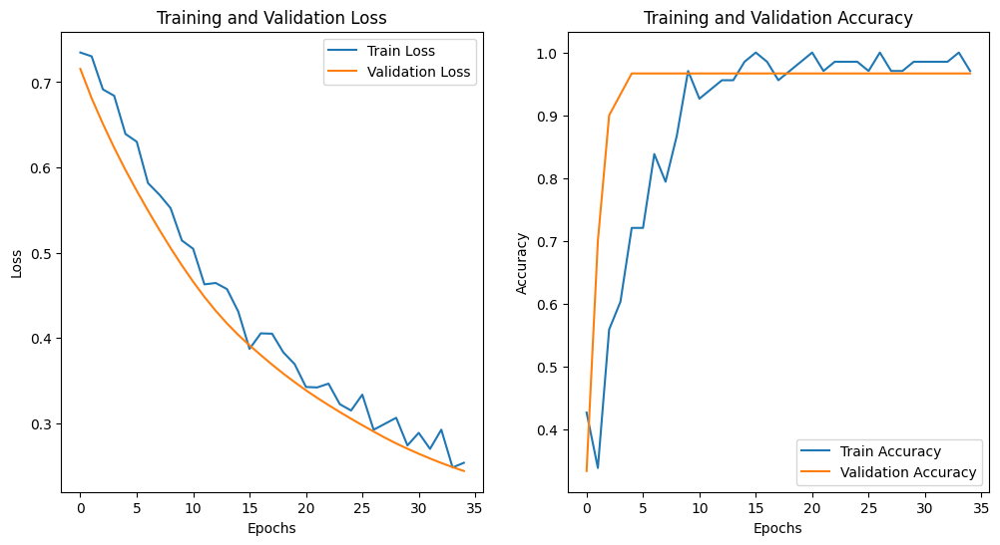

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


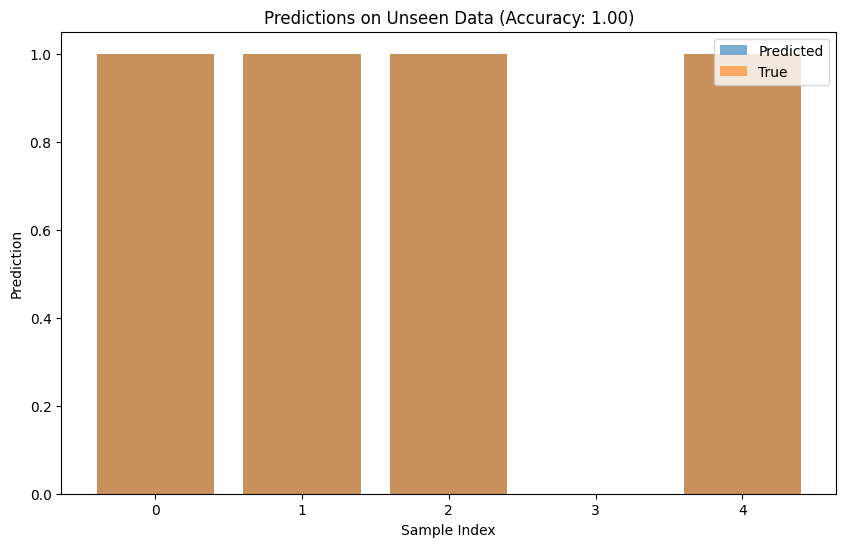

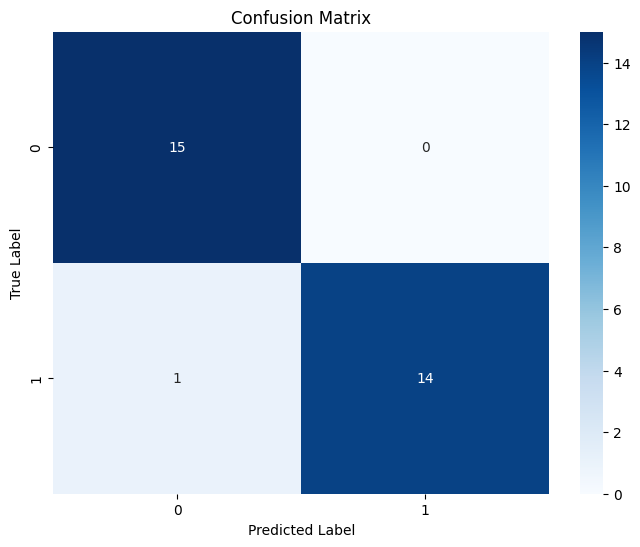

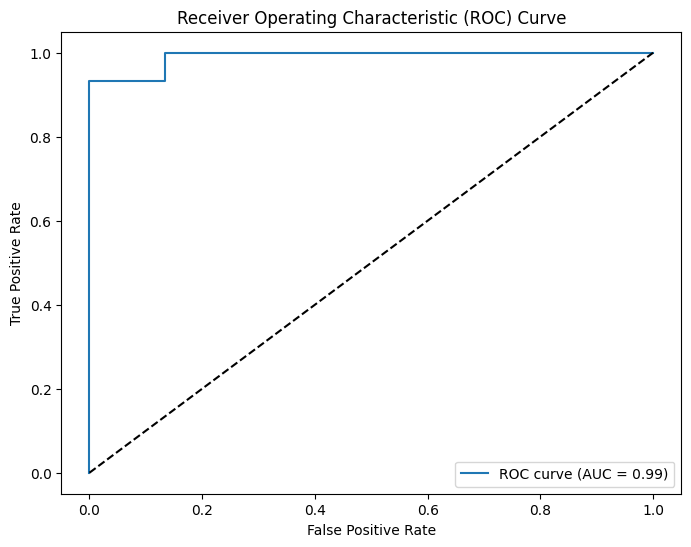

In [10]:
# Evaluate the model
val_predictions = (loaded_model.predict(X_val) > 0.5).astype(int)
val_probabilities = loaded_model.predict(X_val).ravel()

accuracy = accuracy_score(y_val, val_predictions)
precision = precision_score(y_val, val_predictions, zero_division=0)
recall = recall_score(y_val, val_predictions)
f1 = f1_score(y_val, val_predictions)
specificity = recall_score(y_val, val_predictions, pos_label=0)
fpr, tpr, _ = roc_curve(y_val, val_probabilities)
roc_auc = auc(fpr, tpr)

conf_matrix = confusion_matrix(y_val, val_predictions)

# Plot training and validation loss and accuracy curves
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Test on random samples from both sources
sample_indices = random.sample(range(len(X_val)), 5)
unseen_data = X_val[sample_indices]
unseen_labels = y_val[sample_indices]

# Predict using the loaded model
unseen_predictions = (loaded_model.predict(unseen_data) > 0.5).astype(int)
unseen_accuracy = accuracy_score(unseen_labels, unseen_predictions)

# Display predictions on unseen data
plt.figure(figsize=(10, 6))
plt.bar(range(len(unseen_predictions)), unseen_predictions.ravel(), label='Predicted', alpha=0.6)
plt.bar(range(len(unseen_labels)), unseen_labels, label='True', alpha=0.6)
plt.xlabel('Sample Index')
plt.ylabel('Prediction')
plt.title(f'Predictions on Unseen Data (Accuracy: {unseen_accuracy:.2f})')
plt.legend()
plt.show()

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
